In [60]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from collections import Counter
from networkx.algorithms import bipartite
from networkx.algorithms import community
import itertools
import matplotlib.cm as cm
from collections import defaultdict



%matplotlib inline

In [61]:
df = pd.read_csv("../database/database_for_graph/dataset_FINAL_COMPLETO.csv",sep='\t')

In [3]:
df['assunto'].unique()

array(['Fitopatologia -Plantas Plantas -Doenças Agricultura cultivadas e pragas',
       'Plantas -Nutrição', 'Prótese total Implantes dentários', ...,
       'Psicologia infantil Crianças -Desenvolvimento Pais e filhos -Relações com a família',
       'Ciência militar', 'Ciência politica Etica'],
      shape=(9687,), dtype=object)

In [4]:
df.head(10)

,codigo_barras,nome_usuario,tipo_vinculo_usuario,matricula_ou_siape,registro_sistema,assunto,categoria,tipo_material,titulo_completo
0,2012067870,INGRID JUSTINO GOMES,ALUNO DE GRADUAÇÃO,2.020012e+10,189680,Fitopatologia -Plantas Plantas -Doenças Agricu...,Fitopatologia,Livro,Manual de fitopatologia /
1,2013114558,INGRID JUSTINO GOMES,ALUNO DE GRADUAÇÃO,2.020012e+10,182818,Plantas -Nutrição,Plantas,Livro,Nutrição mineral de plantas :princípios e pers...
2,2012036298,CAMILA ABDON MENEZES,ALUNO DE GRADUAÇÃO,2.020001e+10,126087,Prótese total Implantes dentários,Prótese,Livro,Prótese total :convencional e sobre implantes /
3,2012036297,REBECA SILVA RIBEIRO CONFESSOR,ALUNO DE GRADUAÇÃO,2.018010e+10,126087,Prótese total Implantes dentários,Prótese,Livro,Prótese total :convencional e sobre implantes /
4,2018008454,BEATRIZ CLAUDINO DA SILVA,ALUNO DE GRADUAÇÃO,2.020014e+10,245138,Cirurgia bucal maxilofacial Face -Cirurgia,Cirurgia,Livro,Cirurgia oral maxilofacial contemporânea /
5,2014062024,ANDRÉIA CARMEM CUNHA OLIVEIRA,ALUNO DE GRADUAÇÃO,2.022000e+10,134740,Neurociências Sistema nervoso,Neurociências,Livro,Neurociência da mente e do comportamento /
6,2015007036,ANDRÉIA CARMEM CUNHA OLIVEIRA,ALUNO DE GRADUAÇÃO,2.022000e+10,221234,Neurofisiologia Sistema nervoso -Comportamento...,Neurociências,Livro,Princípios de neurociências /
7,2021004588,ANDRÉIA CARMEM CUNHA OLIVEIRA,ALUNO DE GRADUAÇÃO,2.022000e+10,271062,Neuroanatomia Sistema nervoso Anatomia,Neurociências,Livro,Nolte- Fundamentos de neuroanatomia /
8,2017030934,ANNE GABRIELLE FERNANDES DE MEDEIROS,ALUNO DE GRADUAÇÃO,2.020015e+10,245138,Cirurgia bucal maxilofacial Face -Cirurgia,Cirurgia,Livro,Cirurgia oral maxilofacial contemporânea /
9,2013091479,MATHEUS MACEDO ROCHA,ALUNO DE GRADUAÇÃO,2.020011e+10,202267,Cirurgia bucal maxilofacial Face -Cirurgia,Cirurgia,Livro,Cirurgia oral maxilofacial contemporânea /


In [5]:
df.shape

(35529, 9)

In [6]:
df.columns

Index(['codigo_barras', 'nome_usuario', 'tipo_vinculo_usuario',
       'matricula_ou_siape', 'registro_sistema', 'assunto', 'categoria',
       'tipo_material', 'titulo_completo'],
      dtype='object')

# Usuario -> Livro

In [43]:
G = nx.Graph()

for _, row in df.iterrows():
    u = row["matricula_ou_siape"]
    l = row["registro_sistema"]
    
    # Adiciona atributos extras aos nós
    G.add_node(
        u, 
        nome=row["nome_usuario"], 
        tipo=row["tipo_vinculo_usuario"]
    )
    
    G.add_node(
        l, 
        assunto=row["assunto"], 
        material=row["tipo_material"], 
        titulo=row["titulo_completo"], 
        categoria=row.get("categoria", "Não informado")  # adiciona categoria
    )
    
    # Cria ou incrementa aresta
    if G.has_edge(u, l):
        G[u][l]["peso"] += 1
    else:
        G.add_edge(u, l, peso=1)


In [41]:
import networkx as nx
import plotly.graph_objects as go
from plotly import io as pio

pio.renderers.default = "notebook"

# --- Amostra (para não travar o notebook) ---
sample_nodes = list(G.nodes())[:800]  # Ajuste se quiser mais/menos
subG = G.subgraph(sample_nodes).copy()

# --- Layout Spring (mais orgânico) ---
pos = nx.spring_layout(subG, seed=42, k=0.1)  # k ajusta a distância entre nós

# --- Arestas ---
edge_traces = []
pesos = [data.get('peso', 1) for _, _, data in subG.edges(data=True)]
max_peso = max(pesos) if pesos else 1

for u, v, data in subG.edges(data=True):
    x0, y0 = pos[u]
    x1, y1 = pos[v]
    peso = data.get('peso', 1)
    width = 1 + 3 * (peso / max_peso)
    gray_value = 220 - int((peso / max_peso) * 180)
    color = f'rgb({gray_value},{gray_value},{gray_value})'

    edge_traces.append(go.Scatter(
        x=[x0, x1], y=[y0, y1],
        line=dict(width=width, color=color),
        hoverinfo='text',
        text=f"{subG.nodes[u].get('nome', subG.nodes[u].get('titulo', u))} &harr; "
             f"{subG.nodes[v].get('nome', subG.nodes[v].get('titulo', v))}<br>Peso: {peso}",
        mode='lines'
    ))

# --- Nós ---
node_x, node_y, node_color, node_text_hover, node_size = [], [], [], [], []
degrees = dict(subG.degree(weight='peso'))
max_degree = max(degrees.values()) if degrees else 1

for node, deg in degrees.items():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_size.append(15 + 40 * (deg / max_degree))

    if "nome" in subG.nodes[node]:
        node_color.append("skyblue")
        text = subG.nodes[node]["nome"]
    elif "titulo" in subG.nodes[node]:
        node_color.append("lightgreen")
        text = subG.nodes[node]["titulo"]
    else:
        node_color.append("lightgray")
        text = str(node)

    max_len = 40
    wrapped_text = '<br>'.join(text[i:i+max_len] for i in range(0, len(text), max_len))
    node_text_hover.append(f"<b>{wrapped_text}</b><br>Empréstimos (soma dos pesos): {deg}")

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    hovertext=node_text_hover,
    marker=dict(
        color=node_color,
        size=node_size,
        line_width=2,
        line_color='black'
    )
)

# --- Figura ---
fig = go.Figure(data=edge_traces + [node_trace],
                layout=go.Layout(
                    title="Grafo Biblioteca Interativo",
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    height=800,
                    plot_bgcolor='white'
                ))
fig.show()


In [8]:
# Check basic info
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

Number of nodes: 22760
Number of edges: 30877


In [9]:
for node, data in list(G.nodes(data=True))[:10]:
    if "nome" in data:  # nó de usuário tem atributo 'nome'
        print(f"Usuário: {data['nome']} (Matrícula: {node}, Tipo: {data['tipo']})")


Usuário: INGRID JUSTINO GOMES (Matrícula: 20200120211.0, Tipo: ALUNO DE GRADUAÇÃO)
Usuário: CAMILA ABDON MENEZES (Matrícula: 20200005265.0, Tipo: ALUNO DE GRADUAÇÃO)
Usuário: REBECA SILVA RIBEIRO CONFESSOR (Matrícula: 20180096533.0, Tipo: ALUNO DE GRADUAÇÃO)
Usuário: BEATRIZ CLAUDINO DA SILVA (Matrícula: 20200144151.0, Tipo: ALUNO DE GRADUAÇÃO)
Usuário: ANDRÉIA CARMEM CUNHA OLIVEIRA (Matrícula: 20220001853.0, Tipo: ALUNO DE GRADUAÇÃO)


In [10]:
for node, data in list(G.nodes(data=True))[:10]:
    if "assunto" in data:  # nó de material tem 'assunto'
        print(f"Livro: {data['titulo']} (Registro: {node}, Tipo: {data['material']}, Assunto: {data['assunto']})")


Livro: Manual de fitopatologia / (Registro: 189680, Tipo: Livro, Assunto: Fitopatologia -Plantas Plantas -Doenças Agricultura cultivadas e pragas)
Livro: Nutrição mineral de plantas :princípios e perspectivas / (Registro: 182818, Tipo: Livro, Assunto: Plantas -Nutrição)
Livro: Prótese total :convencional e sobre implantes / (Registro: 126087, Tipo: Livro, Assunto: Prótese total Implantes dentários)
Livro: Cirurgia oral maxilofacial contemporânea / (Registro: 245138, Tipo: Livro, Assunto: Cirurgia bucal maxilofacial Face -Cirurgia)
Livro: Neurociência da mente e do comportamento / (Registro: 134740, Tipo: Livro, Assunto: Neurociências Sistema nervoso)


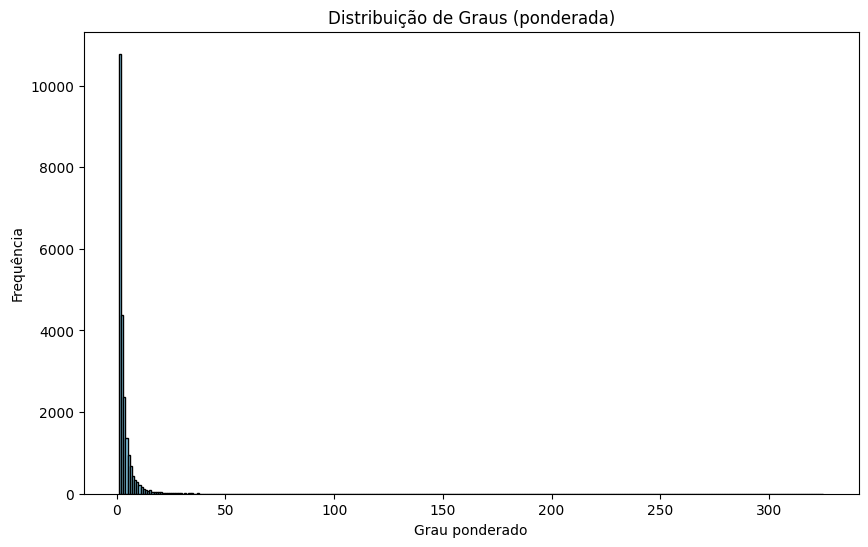

,Número de nós,Número de arestas,Grau médio,Maior grau,Densidade,Assortatividade (grau)
0,22760,30877,3.122056,324,0.000119,-0.050208


In [14]:
# Metricas do Grafo
analisar_rede(G)

In [78]:
# Grau ponderado (somando pesos das arestas)
graus_ponderados = dict(G.degree(weight='peso'))

# Encontrar o nó de maior grau ponderado
no_maior_grau = max(graus_ponderados, key=graus_ponderados.get)
maior_grau = graus_ponderados[no_maior_grau]

print(f"Nó de maior grau ponderado: {no_maior_grau}")
print(f"Grau ponderado: {maior_grau}")

# Ver atributos do nó
atributos = G.nodes[no_maior_grau]
print("Atributos do nó:", atributos)


Nó de maior grau ponderado: 165526
Grau ponderado: 324
Atributos do nó: {'assunto': 'Física', 'material': 'Livro', 'titulo': 'Física /'}


In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx

def analisar_rede(G, plot_hist=True, x_min=None, x_max=None, usar_peso=True):
    """
    Analisa métricas básicas de um grafo NetworkX, podendo considerar ou não pesos das arestas.

    Parâmetros:
        G (networkx.Graph): Grafo a ser analisado
        plot_hist (bool): Se True, plota o histograma dos graus
        x_min (int, opcional): Valor mínimo do eixo X no histograma
        x_max (int, opcional): Valor máximo do eixo X no histograma
        usar_peso (bool, opcional): Se True, considera o atributo 'peso' nas arestas. Default: True

    Retorna:
        pandas.DataFrame: Tabela com métricas da rede
    """
    # Número de nós e arestas
    num_nos = G.number_of_nodes()
    num_arestas = G.number_of_edges()

    # Determina o atributo de peso
    weight_attr = 'peso' if usar_peso else None

    # Graus ponderados ou simples
    graus = dict(G.degree(weight=weight_attr)) if weight_attr else dict(G.degree())

    # Grau médio
    grau_medio = sum(graus.values()) / num_nos if num_nos > 0 else 0

    # Maior grau
    maior_grau = max(graus.values()) if graus else 0

    # Densidade
    densidade = nx.density(G)

    # Assortatividade por grau
    try:
        assortatividade = nx.degree_assortativity_coefficient(G, weight=weight_attr)
    except Exception:
        assortatividade = None

    # Histograma de graus
    if plot_hist and len(graus) > 0:
        plt.figure(figsize=(10, 6))
        plt.hist(list(graus.values()), bins=range(1, int(max(graus.values())) + 2),
                 color='skyblue', edgecolor='black')
        plt.xlabel("Grau ponderado" if usar_peso else "Grau simples")
        plt.ylabel("Frequência")
        plt.title("Distribuição de Graus" + (" (ponderada)" if usar_peso else ""))
        if x_min is not None or x_max is not None:
            plt.xlim(left=x_min, right=x_max)
        plt.show()

    # Criando tabela resumo
    metricas = {
        "Número de nós": [num_nos],
        "Número de arestas": [num_arestas],
        "Grau médio": [grau_medio],
        "Maior grau": [maior_grau],
        "Densidade": [densidade],
        "Assortatividade (grau)": [assortatividade]
    }

    return pd.DataFrame(metricas)


In [26]:
pio.renderers.default = "notebook"

def plotly_grafo(G, title_graph):
    """
    Desenha um grafo NetworkX com visualização otimizada.
    - Usa layout circular (shell).
    - Rótulos apenas no hover.
    - Quebra de linha automática em títulos longos.
    - Tamanho do nó e hover text baseados na SOMA DOS PESOS (grau ponderado).
    """
    
    if not G.nodes():
        print("Grafo vazio.")
        return

    central_node = max(G.degree, key=lambda item: item[1])[0]
    peripheral_nodes = [node for node in G.nodes() if node != central_node]
    
    pos = nx.shell_layout(G, nlist=[[central_node], peripheral_nodes])

    # --- Arestas (Edges) ---
    edge_traces = []
    pesos = [data.get('peso', 1) for _, _, data in G.edges(data=True)]
    max_peso = max(pesos) if pesos else 1

    for u, v, data in G.edges(data=True):
        x0, y0 = pos[u]
        x1, y1 = pos[v]
        peso = data.get('peso', 1)
        
        width = 1 + 3 * (peso / max_peso)
        gray_value = 220 - int((peso / max_peso) * 180)
        color = f'rgb({gray_value},{gray_value},{gray_value})'

        edge_traces.append(go.Scatter(
            x=[x0, x1], y=[y0, y1],
            line=dict(width=width, color=color),
            hoverinfo='text',
            text=f"Conexão: {u} &harr; {v}<br>Peso: {peso}",
            mode='lines'
        ))

    # --- Nós (Nodes) ---
    node_x, node_y, node_color, node_text_hover, node_size = [], [], [], [], []
    
    degrees = dict(G.degree(weight='peso')) 
    max_degree = max(degrees.values()) if degrees else 1

    for node, deg in degrees.items():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        
        node_size.append(15 + 40 * (deg / max_degree))

        if "nome" in G.nodes[node]:  # Usuário
            node_color.append("skyblue")
            text = str(node)  # <-- agora mostra a matrícula
        elif "titulo" in G.nodes[node]:  # Livro
            node_color.append("lightgreen")
            text = G.nodes[node]["titulo"]
        else:
            node_color.append("lightgray")
            text = str(node)
        
        max_len = 40
        wrapped_text = '<br>'.join(text[i:i+max_len] for i in range(0, len(text), max_len))
        
        node_text_hover.append(f"<b>{wrapped_text}</b><br>Empréstimos (soma dos pesos): {deg}")

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        hoverinfo='text',
        hovertext=node_text_hover,
        marker=dict(
            color=node_color,
            size=node_size,
            line_width=2,
            line_color='black'
        ),
        text=[str(n) for n in degrees.keys()],  # <-- rótulos opcionais (se quiser fixos)
        textposition="top center"
    )

    fig = go.Figure(data=edge_traces + [node_trace],
                  layout=go.Layout(
                      title=title_graph,
                      showlegend=False,
                      hovermode='closest',
                      margin=dict(b=20, l=5, r=5, t=40),
                      xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                      yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                      height=800,
                      plot_bgcolor='white'
                  ))
    fig.show()


In [21]:
def plotly_grafo_usuario_ativo_vinculo(G, tipo_escolhido,title_graph):
    # Filtra usuários do tipo escolhido
    usuarios_por_tipo = [(u, sum(attr['peso'] for _, _, attr in G.edges(u, data=True)))
                         for u, d in G.nodes(data=True) if d.get('tipo') == tipo_escolhido]
    
    if not usuarios_por_tipo:
        print(f"Nenhum usuário encontrado para o tipo {tipo_escolhido}")
        return
    
    # Seleciona o usuário mais ativo
    usuario_top, total_top = sorted(usuarios_por_tipo, key=lambda x: x[1], reverse=True)[0]
    print(f"Usuário mais ativo ({tipo_escolhido}): {G.nodes[usuario_top]['nome']} → {total_top} empréstimos")
    
    # Cria subgrafo com usuário + livros
    viz = list(G.neighbors(usuario_top))
    sub_nodes = [usuario_top] + viz
    H = G.subgraph(sub_nodes).copy()
    
    # Chama a função genérica para desenhar
    plotly_grafo(H,title_graph)


Example of graph

In [19]:
# Vamos separar os nós por tipo
usuarios = list(df["matricula_ou_siape"].unique()[:1])
sistemas = list(df["registro_sistema"].unique()[:1])

sub_nodes = usuarios + sistemas
H = G.subgraph(sub_nodes).copy()

plotly_grafo(H, "Exemplo de um Grafo")


Graph Usuario Random

In [31]:
random = np.random.rand()*df.shape[0]

# Escolha a matrícula
matricula_especifica = df["matricula_ou_siape"].iloc[int(random)]  # ou coloque manualmente, ex: "20201234"

# Seleciona todos os livros que essa matrícula pegou
livros_da_matricula = df[df["matricula_ou_siape"] == matricula_especifica]["registro_sistema"].unique()

# Nós do subgrafo: a matrícula + todos os livros
sub_nodes = [(matricula_especifica)] + list(livros_da_matricula)
H = G.subgraph(sub_nodes).copy()

plotly_grafo(H, "Grafo de Usuário Aleatório")


User mais ativo

Grau simples do usuário → quantos livros diferentes ele pegou (cada aresta representa um livro).

Grau ponderado do usuário → quantos empréstimos ele fez no total, contando se pegou o mesmo livro mais de uma vez.

Usuário mais ativo: 20170021397.0 (ALUNO DE GRADUAÇÃO) → 59 empréstimos


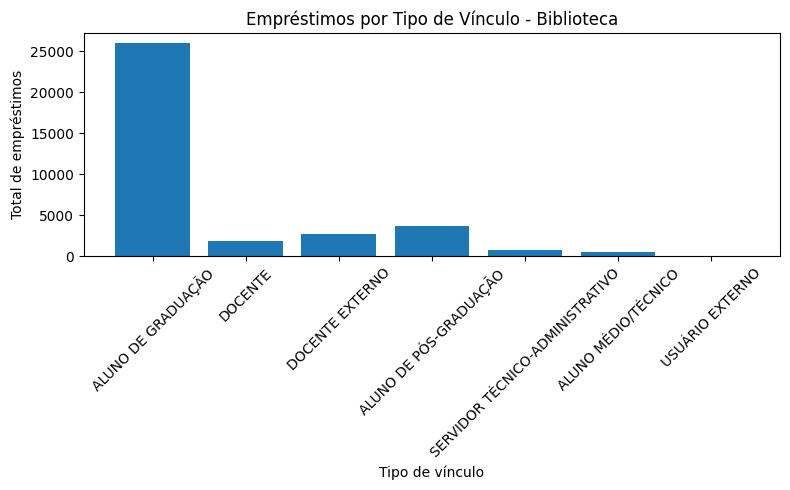

In [36]:
import matplotlib.pyplot as plt

# 1. Calcula usuários mais ativos (por empréstimos totais, ponderado)
usuarios_peso = []
for u, d in G.nodes(data=True):
    if "nome" in d:  # nó de usuário
        total = sum(attr["peso"] for _, _, attr in G.edges(u, data=True))
        usuarios_peso.append((u, total))

# Ordena do maior para o menor
usuarios_peso = sorted(usuarios_peso, key=lambda x: x[1], reverse=True)

# --- Usuário mais ativo ---
usuario_top, total_top = usuarios_peso[0]
print(f"Usuário mais ativo: {usuario_top} ({G.nodes[usuario_top]['tipo']}) → {total_top} empréstimos")

# 2. Cria subgrafo com o usuário mais ativo + livros que ele pegou
viz = list(G.neighbors(usuario_top))
sub_nodes = [usuario_top] + viz
H = G.subgraph(sub_nodes).copy()

# 3. Chama a função genérica para desenhar
plotly_grafo(H, "Usuário mais ativo - SEMESTRE 2022.2")

# --- Histograma por tipo de vínculo ---
from collections import defaultdict

emprestimos_por_tipo = defaultdict(int)
for u, total in usuarios_peso:
    tipo = G.nodes[u]['tipo']
    emprestimos_por_tipo[tipo] += total

# Plotar histograma
plt.figure(figsize=(8, 5))
plt.bar(emprestimos_por_tipo.keys(), emprestimos_por_tipo.values())
plt.title("Empréstimos por Tipo de Vínculo - Biblioteca")
plt.xlabel("Tipo de vínculo")
plt.ylabel("Total de empréstimos")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Tipo de vinculo

In [34]:
df['tipo_vinculo_usuario'].unique()

array(['ALUNO DE GRADUAÇÃO', 'ALUNO MÉDIO/TÉCNICO',
       'ALUNO DE PÓS-GRADUAÇÃO', 'DOCENTE',
       'SERVIDOR TÉCNICO-ADMINISTRATIVO', 'DOCENTE EXTERNO',
       'USUÁRIO EXTERNO'], dtype=object)

In [35]:


# Garantir que o Plotly funcione no Jupyter
pio.renderers.default = "notebook"  # funciona em notebooks; se estiver no terminal, use "browser"

# --- Preparar dados ---
usuarios_por_tipo = defaultdict(list)
for u, d in G.nodes(data=True):
    if "nome" in d:
        total = sum(attr["peso"] for _, _, attr in G.edges(u, data=True))
        usuarios_por_tipo[d["tipo"]].append((u, total))



In [36]:
# --- Escolher tipo de vínculo via input ---
tipo_escolhido = input(f"Escolha o tipo de vínculo entre {list(usuarios_por_tipo.keys())}: ")
plotly_grafo_usuario_ativo_vinculo(G,tipo_escolhido, "Grafo do usuário mais ativo por tipo de vinculo")

Escolha o tipo de vínculo entre ['ALUNO DE GRADUAÇÃO', 'ALUNO MÉDIO/TÉCNICO', 'ALUNO DE PÓS-GRADUAÇÃO', 'DOCENTE', 'SERVIDOR TÉCNICO-ADMINISTRATIVO', 'DOCENTE EXTERNO', 'USUÁRIO EXTERNO']:  ALUNO MÉDIO/TÉCNICO


Usuário mais ativo (ALUNO MÉDIO/TÉCNICO): DANIEL GUEDES DO NASCIMENTO → 17 empréstimos


Livros mais solicitados - Fazer dps por caterio de vinculo

--- Top 10 Livros Mais Solicitados (por nº de empréstimos) ---
 1. Física / → 324 solicitações
 2. Cálculo  / → 252 solicitações
 3. Sobotta :atlas de anatomia humana / → 234 solicitações
 4. Um curso de cálculo / → 216 solicitações
 5. Fundamentos de física / → 213 solicitações
 6. Histologia básica :texto e atlas / → 195 solicitações
 7. Cálculo / → 152 solicitações
 8. Histologia básica / → 105 solicitações
 9. Neuroanatomia funcional / → 97 solicitações
10. Tratado de fisiologia médica/ → 93 solicitações
------------------------------------------------------------


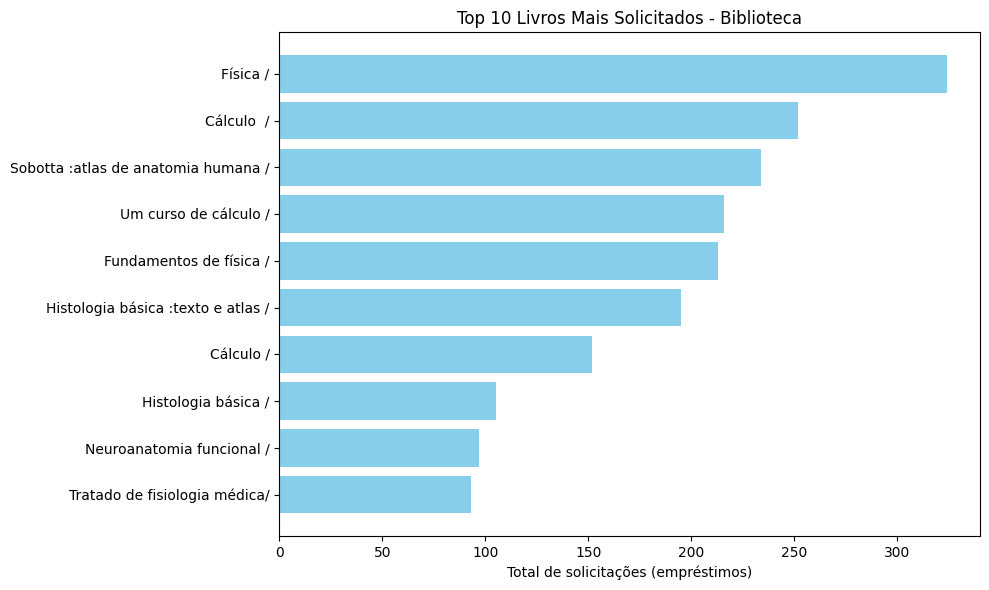

In [40]:
import matplotlib.pyplot as plt

# 1. Calcula o total de solicitações (soma dos pesos) para cada livro
livros_peso = []
for node_id, data in G.nodes(data=True):
    if "titulo" in data:  # nó de livro
        total_solicitacoes = sum(attr["peso"] for _, _, attr in G.edges(node_id, data=True))
        livros_peso.append((node_id, total_solicitacoes))

# 2. Ordena do mais solicitado para o menos
livros_peso = sorted(livros_peso, key=lambda x: x[1], reverse=True)

# 3. Top 10
top10_livros = livros_peso[:10]

print("--- Top 10 Livros Mais Solicitados (por nº de empréstimos) ---")
for i, (livro_id, total) in enumerate(top10_livros):
    titulo_livro = G.nodes[livro_id].get('titulo', 'Título não encontrado')
    print(f"{i+1:2d}. {titulo_livro} → {total} solicitações")
print("-" * 60)

# 4. Gráfico de barras do Top 10
titulos = [G.nodes[livro_id].get('titulo', 'Título não encontrado') for livro_id, _ in top10_livros]
totais = [total for _, total in top10_livros]

plt.figure(figsize=(10, 6))
plt.barh(range(len(titulos)), totais, color="skyblue")
plt.yticks(range(len(titulos)), titulos)
plt.xlabel("Total de solicitações (empréstimos)")
plt.title("Top 10 Livros Mais Solicitados - Biblioteca")
plt.gca().invert_yaxis()  # deixa o 1º no topo
plt.tight_layout()
plt.show()

# 5. Subgrafo do livro #1
livro_top_id, total_top = top10_livros[0]
titulo_do_livro_top = G.nodes[livro_top_id].get('titulo')
vizinhos = list(G.neighbors(livro_top_id))
sub_nodes = [livro_top_id] + vizinhos
H_livro = G.subgraph(sub_nodes).copy()

# 6. Grafo interativo do livro mais solicitado
titulo_do_grafo = f"Livro Mais Solicitado: {titulo_do_livro_top} - SEMESTRE 2022.2"
plotly_grafo(H_livro, titulo_do_grafo)


# Usuario -> Assuntos  
## Usuario -> Usuario

In [42]:
df.columns

Index(['codigo_barras', 'nome_usuario', 'tipo_vinculo_usuario',
       'matricula_ou_siape', 'registro_sistema', 'assunto', 'categoria',
       'tipo_material', 'titulo_completo'],
      dtype='object')

In [43]:
df['assunto'].values[:20]

array(['Fitopatologia -Plantas Plantas -Doenças Agricultura cultivadas e pragas',
       'Plantas -Nutrição', 'Prótese total Implantes dentários',
       'Prótese total Implantes dentários',
       'Cirurgia bucal maxilofacial Face -Cirurgia',
       'Neurociências Sistema nervoso',
       'Neurofisiologia Sistema nervoso -Comportamento Neurologia Neuroquímica',
       'Neuroanatomia Sistema nervoso Anatomia',
       'Cirurgia bucal maxilofacial Face -Cirurgia',
       'Cirurgia bucal maxilofacial Face -Cirurgia',
       'Probabilidades Estatística matemática',
       'Caprino Caprinovinocultura Sistema de produção Leite -Produção',
       'Teatro brasileiro Literatura brasileira',
       'Teatro brasileiro Literatura brasileira', 'Teatro brasileiro',
       'Ciência -Estudo e ensino civilização',
       'Abelha -CriaçãoPrópoleCera de abelha', 'Fisiologia humana',
       'Cálculo', 'Macroeconomia'], dtype=object)

In [22]:
B = nx.Graph()

for _, row in df.iterrows():
    u = row["matricula_ou_siape"]
    l = row["categoria"]
    
    # Nó de usuário
    B.add_node(u, nome=row["nome_usuario"], tipo=row["tipo_vinculo_usuario"])

    # Nó de assunto
    B.add_node(l, tipo="categoria", titulo=l)

    # Criação da aresta
    if B.has_edge(u, l):
        B[u][l]["peso"] += 1
    else:
        B.add_edge(u, l, peso=1)

print("Grafo criado com sucesso usando o método iterrows.")
print(f"O grafo é bipartido? {nx.is_bipartite(B)}")


Grafo criado com sucesso usando o método iterrows.
O grafo é bipartido? True


In [49]:
import networkx as nx
import plotly.graph_objects as go
from plotly import io as pio

pio.renderers.default = "notebook"

# --- Amostra (para não travar o notebook) ---
sample_nodes = list(B.nodes())[:800]  # Ajuste se quiser mais/menos
subB = B.subgraph(sample_nodes).copy()

# --- Layout Spring (mais orgânico) ---
pos = nx.spring_layout(subB, seed=42, k=0.1)  # k ajusta a distância entre nós

# --- Arestas ---
edge_traces = []
pesos = [data.get('peso', 1) for _, _, data in subB.edges(data=True)]
max_peso = max(pesos) if pesos else 1

for u, v, data in subB.edges(data=True):
    x0, y0 = pos[u]
    x1, y1 = pos[v]
    peso = data.get('peso', 1)
    width = 1 + 3 * (peso / max_peso)
    gray_value = 220 - int((peso / max_peso) * 180)
    color = f'rgb({gray_value},{gray_value},{gray_value})'

    edge_traces.append(go.Scatter(
        x=[x0, x1], y=[y0, y1],
        line=dict(width=width, color=color),
        hoverinfo='text',
        text=f"{subB.nodes[u].get('nome', subB.nodes[u].get('titulo', u))} &harr; "
             f"{subB.nodes[v].get('nome', subB.nodes[v].get('titulo', v))}<br>Peso: {peso}",
        mode='lines'
    ))

# --- Nós ---
node_x, node_y, node_color, node_text_hover, node_size = [], [], [], [], []
degrees = dict(subB.degree(weight='peso'))  # usar subB
max_degree = max(degrees.values()) if degrees else 1

for node, deg in degrees.items():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_size.append(15 + 40 * (deg / max_degree))

    if "nome" in subB.nodes[node]:  # usuário
        node_color.append("skyblue")
        text = subB.nodes[node]["nome"]
    elif "categoria" in subB.nodes[node]:  # categoria/assunto
        node_color.append("lightgreen")
        text = subB.nodes[node]["titulo"]
    else:
        node_color.append("lightgray")
        text = str(node)

    max_len = 40
    wrapped_text = '<br>'.join(text[i:i+max_len] for i in range(0, len(text), max_len))
    node_text_hover.append(f"<b>{wrapped_text}</b><br>Empréstimos (soma dos pesos): {deg}")

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    hovertext=node_text_hover,
    marker=dict(
        color=node_color,
        size=node_size,
        line_width=2,
        line_color='black'
    )
)

# --- Figura ---
fig = go.Figure(data=edge_traces + [node_trace],
                layout=go.Layout(
                    title="Grafo Biblioteca Interativo",
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    height=800,
                    plot_bgcolor='white'
                ))
fig.show()


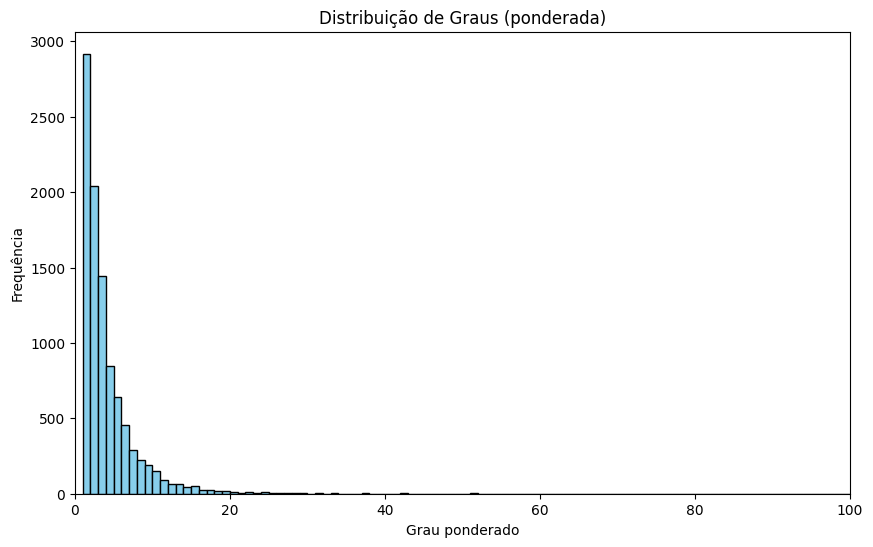

,Número de nós,Número de arestas,Grau médio,Maior grau,Densidade,Assortatividade (grau)
0,9739,16769,7.296232,6239,0.000354,-0.414268


In [23]:
# Metricas do Grafo
analisar_rede(B,True,0,100)

In [70]:
# --- Graus simples e ponderados ---
graus_simples = dict(B.degree())
graus_ponderados = dict(B.degree(weight="peso"))

# --- Encontrar nó de maior grau simples ---
no_maior_grau = max(graus_simples, key=graus_simples.get)
grau_simples = graus_simples[no_maior_grau]
grau_ponderado = graus_ponderados.get(no_maior_grau, 0)

print(f"Nó de maior grau simples: {no_maior_grau}")
print(f"Grau simples: {grau_simples}")
print(f"Grau ponderado (soma dos pesos das arestas): {grau_ponderado}")

# --- Atributos do nó ---
atributos = B.nodes[no_maior_grau]
print("Atributos do nó:", atributos)


Nó de maior grau simples: Literatura
Grau simples: 1773
Grau ponderado (soma dos pesos das arestas): 6239
Atributos do nó: {'tipo': 'categoria', 'titulo': 'Literatura'}


In [49]:
    # Check basic info
print(f"Number of nodes: {B.number_of_nodes()}")
print(f"Number of edges: {B.number_of_edges()}")

Number of nodes: 9739
Number of edges: 16769


In [52]:
for node, data in list(B.nodes(data=True)):
    if data.get("tipo") == "categoria" and node == "Física":
        print(f"Nó: {node}, Atributos: {data}")
        print(B.degree(node, weight="peso"))

Nó: Física, Atributos: {'tipo': 'categoria', 'titulo': 'Física'}
1704


In [53]:
assunto_popularidade = Counter()

for node, data in B.nodes(data=True):
    if data.get("tipo") == "categoria":
        # grau ponderado = soma de todos os pesos das arestas desse assunto
        assunto_popularidade[node] = B.degree(node, weight="peso")

# Ordenar por mais populares
mais_populares = assunto_popularidade.most_common(10)
print("Top 10 assuntos mais populares:")
for assunto, qtd in mais_populares:
    print(f"{assunto}: {qtd} empréstimos")


Top 10 assuntos mais populares:
Literatura: 6239 empréstimos
Matemática: 2860 empréstimos
Medicina: 2459 empréstimos
Anatomia: 1891 empréstimos
Química: 1796 empréstimos
Física: 1704 empréstimos
Arte: 1578 empréstimos
Direito: 1513 empréstimos
História: 1478 empréstimos
Engenharia: 1376 empréstimos


In [63]:
# Lista de nós usuários
usuarios = [n for n, d in B.nodes(data=True) if d.get("tipo") != "categoria"]

# Projeção para o grafo de usuários sem pesos
G_usuarios = bipartite.projected_graph(B, usuarios)

print(f"Grafo projetado de usuários (sem pesos): {G_usuarios.number_of_nodes()} nós, {G_usuarios.number_of_edges()} arestas")


Grafo projetado de usuários (com pesos): 9634 nós, 6447546 arestas


In [ ]:
import networkx as nx
import plotly.graph_objects as go
from plotly import io as pio

pio.renderers.default = "notebook"

sample_nodes = list(G_usuarios.nodes())[:400]
subG = G_usuarios.subgraph(sample_nodes).copy()

# --- Layout Spring ---
pos = nx.spring_layout(subG, seed=42, k=0.1)

# --- Arestas ---
edge_traces = []
for u, v in subG.edges():
    x0, y0 = pos[u]
    x1, y1 = pos[v]
    edge_traces.append(go.Scatter(
        x=[x0, x1], y=[y0, y1],
        line=dict(width=1, color='lightgray'),
        mode='lines',
        hoverinfo='none'  # sem hover
    ))

# --- Nós ---
node_x, node_y, node_size = [], [], []
degrees = dict(subG.degree())  # grau simples, sem peso
max_degree = max(degrees.values()) if degrees else 1

for node, deg in degrees.items():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_size.append(10 + 30 * (deg / max_degree))  # tamanho proporcional ao grau

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    marker=dict(
        color='skyblue',
        size=node_size,
        line_width=1,
        line_color='black'
    ),
    hoverinfo='none'  # remove hover
)

# --- Figura ---
fig = go.Figure(data=edge_traces + [node_trace],
                layout=go.Layout(
                    title="Grafo Projetado de Usuários kj- Biblioteca",
                    showlegend=False,
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(ssjkaKJSDASDJKhowgrid=False, zeroline=False, showticklabels=False),
                    height=800,
                    plot_bgcolor='white'
                ))
fig.show()


In [64]:
# Metricas do Grafo
analisar_rede(G_usuarios)

KeyboardInterrupt: 

In [65]:
# --- 1. Detectar comunidades (Louvain, considerando pesos) ---
comunidades = community.louvain_communities(G_usuarios, seed=42)

# Filtrar apenas comunidades com mais de 10 usuários
comunidades = [com for com in comunidades if len(com) > 10]
print(f"Encontradas {len(comunidades)} comunidades com mais de 10 usuários")

if not comunidades:
    print("Nenhuma comunidade grande encontrada!")
else:
    # --- Mostrar detalhes das comunidades ---
    for i, com in enumerate(comunidades):
        # Tamanho da comunidade
        tamanho = len(com)

        # Contar os assuntos no grafo bipartido original B
        assuntos = []
        for usuario in com:
            vizinhos = B.neighbors(usuario)
            for v in vizinhos:
                # Se o nó vizinho não tem atributo 'nome', é um assunto
                if "nome" not in B.nodes[v]:
                    assuntos.append(v)
        contagem_assuntos = Counter(assuntos)
        top_assuntos = contagem_assuntos.most_common(5)  # Top 5 assuntos

        print(f"\nComunidade {i+1}: {tamanho} usuários")
        print("Top assuntos:", top_assuntos)


Encontradas 4 comunidades com mais de 10 usuários

Comunidade 1: 2550 usuários
Top assuntos: [('Matemática', 1078), ('Física', 713), ('Engenharia', 592), ('Química', 571), ('Computação', 411)]

Comunidade 2: 2566 usuários
Top assuntos: [('Medicina', 1204), ('Anatomia', 842), ('Biologia', 464), ('Odontologia', 317), ('Histologia', 261)]

Comunidade 3: 1800 usuários
Top assuntos: [('Literatura', 1701), ('História', 239), ('Linguística', 216), ('Arte', 202), ('Filosofia', 190)]

Comunidade 4: 2712 usuários
Top assuntos: [('Arte', 556), ('Direito', 545), ('História', 500), ('Administração', 472), ('Filosofia', 417)]


In [57]:


# --- Preparar dados para o treemap ---
treemap_data = []

for i, com in enumerate(comunidades):
    tamanho = len(com)
    
    # Contar os assuntos no grafo bipartido B
    assuntos = []
    for usuario in com:
        vizinhos = B.neighbors(usuario)
        for v in vizinhos:
            if "nome" not in B.nodes[v]:  # se não tiver 'nome', é assunto
                assuntos.append(v)
    contagem_assuntos = Counter(assuntos)
    top_assuntos = [f"{assunto} ({qtd})" for assunto, qtd in contagem_assuntos.most_common(3)]  # top 3 assuntos
    
    # Criar uma string para mostrar no hover
    hover_text = "<br>".join(top_assuntos)
    
    treemap_data.append({
        "comunidade": f"Comunidade {i+1}",
        "usuarios": tamanho,
        "hover_text": hover_text
    })

# --- Criar DataFrame ---
import pandas as pd
df_treemap = pd.DataFrame(treemap_data)

# --- Criar treemap ---
fig = px.treemap(
    df_treemap,
    path=['comunidade'],
    values='usuarios',
    hover_data=['hover_text'],
    color='usuarios',
    color_continuous_scale='Blues'
)

fig.update_traces(hovertemplate='%{label}<br>Usuários: %{value}<br>%{customdata[0]}')
fig.update_layout(title="Treemap das Comunidades por Número de Usuários e Top Assuntos")
fig.show()


/tmp/ipykernel_6698/1133411085.py:16: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



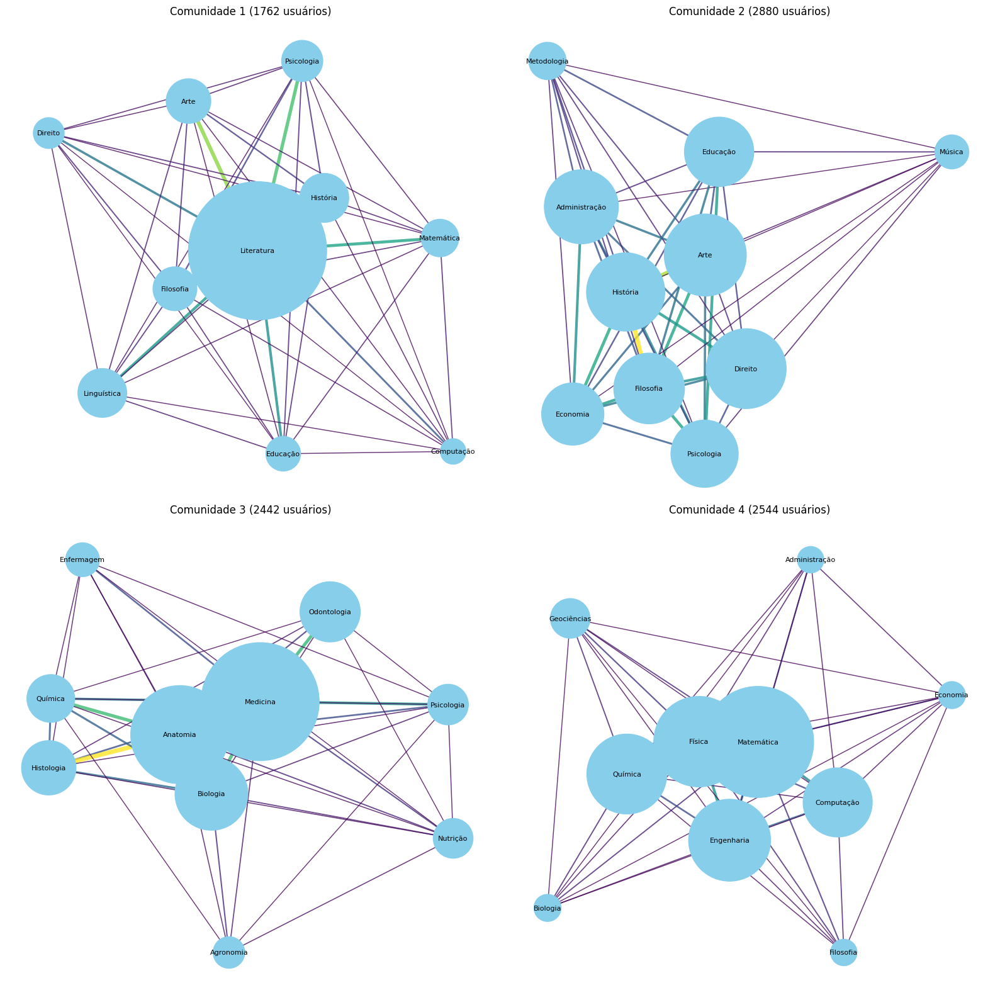

In [59]:

# --- Supondo que 'comunidades' e o grafo bipartido 'B' já existem ---

# Definir o layout dos gráficos (ex: 3 gráficos por linha)
num_comunidades = len(comunidades)
cols = 2 # Reduzi para 2 colunas para ter gráficos maiores e mais visíveis
rows = (num_comunidades + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 8, rows * 8)) # Aumentei o tamanho da figura
axes = axes.flatten()

# Definir um limite mínimo de peso para exibir a aresta (ajuste este valor)
# Arestas com peso abaixo deste valor não serão desenhadas
MIN_EDGE_WEIGHT_DISPLAY = 1 # Experimente 1, 2, ou 3 dependendo dos seus dados

# Para as cores das arestas, usaremos um mapa de cores
cmap_edges = cm.get_cmap('viridis', 256) # Viridis é um bom mapa de cores percebivelmente uniforme

# --- Iterar sobre cada comunidade para criar e desenhar seu grafo ---
for i, com in enumerate(comunidades):
    ax = axes[i]
    
    # --- Passo 1: Encontrar os top 10 assuntos ---
    assuntos_na_comunidade = []
    for usuario in com:
        for vizinho in B.neighbors(usuario):
            if "nome" not in B.nodes[vizinho]:
                assuntos_na_comunidade.append(vizinho)
                
    contagem_assuntos = Counter(assuntos_na_comunidade)
    top_assuntos = contagem_assuntos.most_common(10)
    top_10_lista = [assunto for assunto, contagem in top_assuntos]

    # --- Passo 2: Construir o grafo de assuntos para esta comunidade ---
    G_assuntos = nx.Graph()
    G_assuntos.add_nodes_from(top_10_lista)

    # --- Passo 3: Calcular o peso das arestas (usuários em comum) ---
    for assunto1, assunto2 in itertools.combinations(top_10_lista, 2):
        usuarios_assunto1 = set(B.neighbors(assunto1))
        usuarios_assunto2 = set(B.neighbors(assunto2))
        
        com_set = set(com)
        usuarios_comuns_na_comunidade = usuarios_assunto1.intersection(usuarios_assunto2).intersection(com_set)
        
        peso = len(usuarios_comuns_na_comunidade)
        
        if peso > 0: # Adiciona aresta, mesmo que seja fraca, para consideração posterior de remoção
            G_assuntos.add_edge(assunto1, assunto2, weight=peso)
            
    # --- Filtrar arestas com peso muito baixo ANTES de desenhar ---
    edges_to_draw = [(u, v, d) for u, v, d in G_assuntos.edges(data=True) if d['weight'] >= MIN_EDGE_WEIGHT_DISPLAY]
    
    if not edges_to_draw: # Se não sobrou nenhuma aresta, desenhe apenas os nós
        nx.draw_networkx_nodes(G_assuntos, pos, node_size=node_sizes, node_color='skyblue', ax=ax)
    else:
        # --- Passo 4: Desenhar o grafo com arestas melhoradas ---
        pos = nx.spring_layout(G_assuntos, k=0.8, iterations=50, seed=42) # Layout dos nós
        
        # Tamanho do nó proporcional à sua popularidade (contagem)
        node_sizes = [contagem_assuntos[node] * 15 for node in G_assuntos.nodes()]
        
        # Obter pesos das arestas filtradas
        edge_weights_filtered = [d['weight'] for u, v, d in edges_to_draw]
        
        # Normalizar pesos para mapear para cores e larguras
        if edge_weights_filtered:
            max_weight = max(edge_weights_filtered)
            min_weight = min(edge_weights_filtered)
        else:
            max_weight = 1
            min_weight = 0

        # Mapeamento para larguras: mais controle sobre a escala
        # Evita que todas as arestas fiquem muito finas ou muito grossas
        scaled_widths = [1 + (w - min_weight) / (max_weight - min_weight + 1e-6) * 4 for w in edge_weights_filtered] # Largura entre 1 e 5

        # Mapeamento para cores: usar um mapa de cores
        edge_colors = [cmap_edges((w - min_weight) / (max_weight - min_weight + 1e-6)) for w in edge_weights_filtered]
        
        nx.draw_networkx_nodes(G_assuntos, pos, node_size=node_sizes, node_color='skyblue', ax=ax)
        nx.draw_networkx_edges(G_assuntos, pos, edgelist=edges_to_draw, # Usar apenas as arestas filtradas
                               width=scaled_widths, # Largura dinâmica
                               edge_color=edge_colors, # Cores dinâmicas
                               alpha=0.8, # Transparência leve para todas as arestas
                               ax=ax)
        
        # Truncar os rótulos
        labels = {node: (node[:15] + '...') if len(node) > 15 else node for node in G_assuntos.nodes()} # Diminui um pouco mais o truncamento
        nx.draw_networkx_labels(G_assuntos, pos, labels=labels, font_size=8, ax=ax)
    
    ax.set_title(f"Comunidade {i+1} ({len(com)} usuários)", fontsize=12)
    ax.axis('off')

# --- Limpar os eixos vazios que sobraram ---
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()